# Avance 2 Equipo 20 – Ingeniería de características (Feature Engineering)

## Proyecto: Detección y Clasificación de Anillos en Galaxias  
**Materia:** Proyecto Integrador (Tec de Monterrey / UNAM)  
**Equipo:** Equipo 20  
**Fecha:** 06/02/2026

---

### Propósito (CRISP-ML: Preparación de los datos)
El objetivo de este avance es ejecutar ingeniería de características en los conjuntos de datos disponibles. El resultado final será un conjunto de datos viable para ser consumido por modelos de Machine Learning para entrenamiento.
**Objetivos (rúbrica):**
- **2.3** Crear nuevas características para mejorar el rendimiento de futuros modelos.
- **2.4** Mitigar riesgo de características sesgadas y acelerar convergencia (escalamiento/transformaciones).


In [1]:
!pip install astropy
!pip install photutils

In [ ]:
# =========================
# Imports y configuración
# =========================
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import urllib.request

from astropy.io import fits
from astropy.visualization import make_lupton_rgb
from astropy.convolution import Gaussian2DKernel, convolve
from astropy.stats import sigma_clipped_stats, SigmaClip
from astropy.visualization import (AsinhStretch, ImageNormalize,
                                   ZScaleInterval)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from PIL import Image, ImageFile

from scipy.ndimage import gaussian_filter

from photutils.background import Background2D, MedianBackground
from astropy.stats import SigmaClip

from PIL import Image

plt.rcParams["figure.figsize"] = (8, 5)
pd.set_option("display.max_columns", 200)
pd.set_option("display.width", 180)

# =========================
# Montar Google Drive
# =========================
# from google.colab import drive
# drive.mount("/content/drive")

import os

current_dir = os.getcwd()
data_path = os.path.join(current_dir, '..', 'Datasets')
os.makedirs(data_path, exist_ok=True)

HOME_PATH = data_path


## 1) Carga del dataset y validación de columnas

En esta sección
- Conservamos el **catálogo** de clases del Avance 1.
- Filtramos dataset para omitir clases fuera del alcance de este proyecto (anillos nuclears y pseudoanillos)

In [21]:
hdulist = fits.open(f'{HOME_PATH}/dataset.fits')
data = hdulist[1].data
df = pd.DataFrame(data)

for col in df.columns:
    if df[col].dtype == '>i8':
        df[col] = df[col].astype(np.int64)
    elif df[col].dtype == '>f8':
        df[col] = df[col].astype(np.float64)

print("Shape:", df.shape)
df.describe()

Shape: (8528, 5)


,objID,ra,dec,z,anillos
count,8.528000e+03,8528.000000,8528.000000,8528.000000,8528.000000
mean,1.237662e+18,183.268013,25.180086,0.035896,1.767589
std,5.887859e+12,59.249332,18.394527,0.015032,4.059707
min,1.237649e+18,0.008759,-11.082615,0.010068,0.000000
25%,1.237658e+18,153.145473,10.446179,0.024653,0.000000
50%,1.237662e+18,185.068475,23.905970,0.033006,0.000000
75%,1.237666e+18,219.528357,39.203309,0.044839,0.000000
max,1.237680e+18,359.276680,70.133229,0.098892,16.000000


In [22]:
# Catálogo del Avance 1 (código -> interpretación física)
ANILLOS_MAP = {
    0:  "Sin anillo",
    2:  "Anillo nuclear",
    4:  "Anillo interno",
    8:  "Anillo externo",
    12: "Anillo interno + externo",
    16: "Anillos parciales / pseudoanillos"
}

# Asegurar consistencia numérica
df["anillos"] = pd.to_numeric(df["anillos"], errors="coerce")

df["anillos_label"] = df["anillos"].round().astype("Int64").map(ANILLOS_MAP)
display(df["anillos_label"].value_counts(dropna=False))


anillos_label
Sin anillo                           6660
Anillo interno                        857
Anillo interno + externo              372
Anillos parciales / pseudoanillos     342
Anillo externo                        186
Anillo nuclear                        111
Name: count, dtype: int64

## 2) Redefinición de la variable objetivo (decisión de dominio)

Debido a resolución/escala (relacionada con *z*) y limitaciones de dataset, es difícil detectar consistentemente:
- **Anillos nucleares**
- **Pseudoanillos / anillos parciales**

Por tanto, para una clasificación **robusta** se plantea omitir las galaxias clasificadas como anillos nucleares (2) y pseudoanillos/anillos parciales (16).


In [23]:
# 2.1 Target 3-clases: 0 none, 1 inner, 2 outer, 3 inner+outer
# Regla: 12 (inner+outer) -> outer por ser estructura global más detectable (ajustable)
def to_4class(code):
    if pd.isna(code):
        return np.nan
    code = int(round(code))
    if code == 0: #no ring
        return 0
    if code == 4: #inner ring
        return 1
    if code == 8: #outer ring
        return 2
    if code == 12: #inner + outer ring
        return 3
    # descartamos nuclear(2) y pseudo(16) por decisión de dominio
    return np.nan

#filter out "anillos" == 2 and "anillos" == 16
df = df[(df["anillos"] != 2.0) & (df["anillos"] != 16.0)]
df["ring_class"] = df["anillos"].apply(to_4class)


In [24]:
#filtrar por z
sigma_threshold = 2

mean = df['z'].mean()
std = df['z'].std()

# Define your upper and lower bounds
lower_bound = mean - (sigma_threshold * std)
upper_bound = mean + (sigma_threshold * std)

# Filter the DataFrame
dfGalaxies = df[(df['z'] >= lower_bound) & (df['z'] <= upper_bound)]

print("\nDistribución target 4-clases (con NaN = clases descartadas):")
display(dfGalaxies["anillos"].value_counts(dropna=False))


Distribución target 4-clases (con NaN = clases descartadas):


anillos
0.0     6346
4.0      837
12.0     363
8.0      177
Name: count, dtype: int64

In [25]:
dfGalaxies.describe()

,objID,ra,dec,z,anillos,ring_class
count,7.723000e+03,7723.000000,7723.000000,7723.000000,7723.000000,7723.000000
mean,1.237662e+18,184.216034,25.087080,0.034072,1.180888,0.295222
std,5.869118e+12,58.987520,18.293270,0.012894,2.928446,0.732112
min,1.237649e+18,0.008759,-11.015802,0.010068,0.000000,0.000000
25%,1.237658e+18,154.576350,10.449613,0.024152,0.000000,0.000000
50%,1.237662e+18,186.402640,23.794341,0.032102,0.000000,0.000000
75%,1.237666e+18,220.073035,39.001103,0.042785,0.000000,0.000000
max,1.237680e+18,359.276680,70.133229,0.065954,12.000000,3.000000


## 3) Ingeniería de características tabulares (z, RA/DEC, etc.)

### 3.1 Corrimiento al rojo (*z*) y su impacto en escala/resolución
- *z* tiende a estar sesgada (muchos valores bajos).  
- Para modelos sensibles a escala/gradiente, aplicamos **transformación log(1+z)**.
- Además, discretizamos *z* en bins para capturar efectos **no lineales** (cercanas vs lejanas).

### 3.2 RA/DEC: codificación circular
- RA está en grados (0–360) y es **circular**.
- Representamos RA y DEC con **sin/cos** para evitar discontinuidades (ej. 359° ~ 1°).


In [26]:
# 3.1 Transformaciones de z
dfGalaxies["z_log1p"] = np.log1p(dfGalaxies["z"].clip(lower=0))

# Binning por cuantiles (3 grupos)
dfGalaxies["z_bin"] = pd.qcut(dfGalaxies["z"], q=3, labels=["low_z", "mid_z", "high_z"])

# 3.2 Codificación circular de RA y DEC (en radianes)
ra_rad = np.deg2rad(dfGalaxies["ra"].astype(float))
dec_rad = np.deg2rad(dfGalaxies["dec"].astype(float))

dfGalaxies["ra_sin"] = np.sin(ra_rad)
dfGalaxies["ra_cos"] = np.cos(ra_rad)
dfGalaxies["dec_sin"] = np.sin(dec_rad)
dfGalaxies["dec_cos"] = np.cos(dec_rad)

dfGalaxies[["z", "z_log1p", "z_bin", "ra_sin", "ra_cos", "dec_sin", "dec_cos"]].head()


,z,z_log1p,z_bin,ra_sin,ra_cos,dec_sin,dec_cos
0,0.028206,0.027815,mid_z,0.713896,-0.700251,-0.003490,0.999994
1,0.048037,0.046919,high_z,-0.312891,-0.949789,0.016426,0.999865
2,0.024114,0.023828,low_z,-0.330431,-0.943830,0.009208,0.999958
3,0.033483,0.032935,mid_z,0.246312,-0.969191,-0.016791,0.999859
4,0.024694,0.024394,low_z,0.520593,0.853805,0.229218,0.973375


## 4) Imágenes: obtención y **features** guiadas por dominio

### Action items cubiertos aquí
- Probar **color**, **grayscale** y **color index map** (muy rojo vs muy azul).
- Probar **reducción de tamaño** (impacto en features y estabilidad).
- Extraer características que dependan del **centrado** (posición central) y de la **estructura radial**.

> Nota: En Avance 1, el equipo descargó imágenes JPEG (Legacy Survey) y creó `img_path`.  
Aquí replicamos esa lógica: si ya existen imágenes en `Images/`, las usamos; si no, descargamos una muestra.


In [27]:
def download_legacy_fits(ra, dec, out_path, size=256, pixscale=0.262, layer="ls-dr9", bands="grz"):
    url = (
        f"https://www.legacysurvey.org/viewer/fits-cutout?"
        f"ra={ra}&dec={dec}&size={size}&layer={layer}&pixscale={pixscale}&bands={bands}"
    )
    print("Downloading from: " + url)
    urllib.request.urlretrieve(url, out_path)

N_SAMPLE = 10

sample_df = dfGalaxies.sample(n=min(N_SAMPLE, len(dfGalaxies)), random_state=42)

IMAGE_DIR = os.path.join(HOME_PATH, "Images")
os.makedirs(IMAGE_DIR, exist_ok=True)

fits_paths = []
z_values = []
downloaded = 0
for i, row in sample_df.iterrows():
    fname = f"{row['objID']}.fits"
    fpath = os.path.join(IMAGE_DIR, fname)
    fits_paths.append(fpath)
    z_values.append(row['anillos'])
    if not os.path.exists(fpath):
        try:
            download_legacy_fits(row["ra"], row["dec"], fpath)
            downloaded += 1
        except Exception as e:
            pass

print("Imágenes descargadas en esta corrida:", downloaded)
print("Total de imágenes en carpeta:", len(os.listdir(IMAGE_DIR)))

Imágenes descargadas en esta corrida: 10
Total de imágenes en carpeta: 10


In [29]:
# Función para mapear objID
image_paths = {}
for fn in os.listdir(IMAGE_DIR):
    if fn.lower().endswith(".fits"):
        key = fn.replace(".fits", "")
        print(key)
        image_paths[key] = os.path.join(IMAGE_DIR, fn)

sample_df["img_path"] = sample_df["objID"].astype(str).map(image_paths)
print("Con imagen:", sample_df["img_path"].notna().sum(), " / ", len(dfGalaxies))
sample_df.head()


1237655504036627107
1237655691402805427
1237657771784142857
1237658492269297866
1237659324418556303
1237661383843840184
1237661418750542003
1237662236396683371
1237665226229874837
1237678617430196472
Con imagen: 10  /  7723


,objID,ra,dec,z,anillos,anillos_label,ring_class,z_log1p,z_bin,ra_sin,ra_cos,dec_sin,dec_cos,img_path
4511,1237662236396683371,194.281410,8.875709,0.028320,0.0,Sin anillo,0,0.027926,mid_z,-0.246685,-0.969096,0.154292,0.988025,c:\Users\Francisco-PC\Documents\Tec de Monterr...
2447,1237661383843840184,139.672790,33.418075,0.042253,0.0,Sin anillo,0,0.041385,high_z,0.647152,-0.762361,0.550744,0.834674,c:\Users\Francisco-PC\Documents\Tec de Monterr...
3106,1237659324418556303,245.501030,38.915048,0.017290,0.0,Sin anillo,0,0.017142,low_z,-0.909969,-0.414677,0.628167,0.778078,c:\Users\Francisco-PC\Documents\Tec de Monterr...
1166,1237655691402805427,220.823420,-2.754000,0.058731,0.0,Sin anillo,0,0.057071,high_z,-0.653730,-0.756728,-0.048048,0.998845,c:\Users\Francisco-PC\Documents\Tec de Monterr...
6626,1237678617430196472,28.313523,1.039092,0.059680,0.0,Sin anillo,0,0.057967,high_z,0.474296,0.880365,0.018135,0.999836,c:\Users\Francisco-PC\Documents\Tec de Monterr...


### 4.1 Utilidades: lectura, resize y representaciones (RGB / grayscale / color-index)

**Color-index (R-B)/(R+B):** resalta regiones relativamente más rojas o azules.  
En astronomía, el color se asocia a poblaciones estelares/actividad, y puede aportar señales complementarias a la morfología.


####4.1.1 Funciones de Preprocesamiento de Imágenes

In [47]:
#Helper functions
def channels_to_rgb(r, g, z):
    """ Convertir los canales en una imágen RGB compuesta.

    Args:
        r (np.ndarray): Canal rojo.
        g (np.ndarray): Canal verde.
        z (np.ndarray): Canal azul.

    Returns:
        np.ndarray: Imagen RGB compuesta.
    """
    # Se utiliza la función make_lupton_rgb debido a que ayuda
    # a manejar el alto rango de imágenes astronómicas controlando
    # el contraste y la saturación, manteniendo el color.
    # Convert input channels to float to avoid UFuncTypeError
    r_float = r.astype(np.float32)
    g_float = g.astype(np.float32)
    z_float = z.astype(np.float32)
    rgb_img = make_lupton_rgb(r_float, g_float, z_float, stretch=0.5, Q=6)
    return rgb_img

In [46]:
def plot_bands(g, r, z, rgb):
  fig, axs = plt.subplots(1, 4, figsize=(20, 20))
  axs[0].imshow(g, cmap='gray', origin='lower')
  axs[0].set_title('g band')
  axs[1].imshow(r, cmap='gray', origin='lower')
  axs[1].set_title('r band')
  axs[2].imshow(z, cmap='gray', origin='lower')
  axs[2].set_title('z band')
  axs[3].imshow(rgb, cmap='gray', origin='lower')
  axs[3].set_title('rgb')
  sns.set_style("whitegrid")
  plt.figure(figsize=(8, 8))
  plt.tight_layout()
  plt.show()

In [95]:
#Background Substraction - Reduces noise by substracting the median background from the image
def subtract_sky(data, filter_size = 5, box_size = 50):
    # 1. Define how to identify outliers (stars/galaxy)
    sigma_clip = SigmaClip(sigma=3.0)

    # 2. Define the estimator (Median is robust to bright stars)
    bkg_estimator = MedianBackground()

    # 3. Calculate the background
    # box_size: should be larger than the objects you want to keep!
    # filter_size: smoothes the background map
    bkg = Background2D(data, box_size=(box_size, box_size),
                       filter_size=(filter_size, filter_size),
                       sigma_clip=sigma_clip,
                       bkg_estimator=bkg_estimator)

    # 4. Subtract and return
    return data - bkg.background, bkg.background

def plot_subtraction_check(original, bkg_map, subtracted, band_name="g"):
    # We use ZScaleInterval to automatically find good contrast limits
    norm = ImageNormalize(original, interval=ZScaleInterval(),
                          stretch=AsinhStretch())

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # 1. Original Image
    im0 = axes[0].imshow(original, origin='lower', norm=norm, cmap='gray')
    axes[0].set_title(f'Original ({band_name})')
    plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    # 2. The Estimated Background (The "Sky Model")
    im1 = axes[1].imshow(bkg_map, origin='lower', cmap='viridis')
    axes[1].set_title('Estimated Background')
    plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # 3. The Result (Sky-Subtracted)
    im2 = axes[2].imshow(subtracted, origin='lower', norm=norm, cmap='gray')
    axes[2].set_title('Subtracted Result')
    plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

def apply_background_subtraction(g, r, z):
  clean_g_band, g_bkg_map = subtract_sky(g, filter_size=7, box_size=50)
  clean_r_band, r_bkg_map = subtract_sky(r, filter_size=7, box_size=50)
  clean_z_band, z_bkg_map = subtract_sky(z, filter_size=9, box_size=50)

  plot_subtraction_check(g, g_bkg_map, clean_g_band, "g")
  plot_subtraction_check(r, r_bkg_map, clean_r_band, "r")
  plot_subtraction_check(z, z_bkg_map, clean_z_band, "z")

  return clean_g_band, clean_r_band, clean_z_band

In [233]:
import numpy as np
from scipy.ndimage import gaussian_filter

def unsharp_mask(image, sigma=1.0, amount=1.0, threshold=0):
    """
    Applies unsharp masking to a numpy array.
    
    Parameters:
    - image: input numpy array (2D for grayscale, 3D for RGB).
    - sigma: standard deviation for Gaussian blur (controls the width of the edges).
    - amount: multiplier for the sharpening effect (usually 0.5 to 2.0).
    - threshold: minimum brightness change to be sharpened (helps reduce noise).
    """
    # 1. Create the blurred version of the image
    # For RGB images, we don't blur along the color channel axis
    if image.ndim == 3:
        blurred = gaussian_filter(image, sigma=(sigma, sigma, 0))
    else:
        blurred = gaussian_filter(image, sigma=sigma)
    
    # 2. Calculate the mask (Original - Blurred)
    mask = image - blurred
    
    # 3. Apply thresholding if needed to avoid sharpening noise
    if threshold > 0:
        mask[np.abs(mask) < threshold] = 0
    
    # 4. Add the weighted mask back to the original image
    sharpened = image + amount * mask
    
    return blurred, sharpened

In [129]:
#Calculate color band indexes

#New stars and dust
def calculate_gz_index(g_data, z_data):
    """
    Calculates the g-z Color Index, highlighting younger stars and zones of active stellar formation.
    """
    # 1. Simple Background Subtraction (Median)
    g_data -= np.median(g_data)
    z_data -= np.median(z_data)

    # 2. Calculate the Normalized Difference Index
    # Formula: (g - z) / (g + z)
    # Adding epsilon to denominator to avoid division by zero
    epsilon = 1e-9
    gz_index = g_data / (z_data + epsilon) #(g_data - z_data) / (g_data + z_data + epsilon)

    gz_index = np.clip(gz_index, -0.8, 0.8)

    # 3. Masking low signal-to-noise areas
    # This prevents the 'noise' in the empty background from dominating the index
    mask = (g_data + z_data) < (np.std(g_data) * 1.2)
    gz_index[mask] = np.nan

    return gz_index

#Older stars
def calculate_rz_index(r_data, z_data, r_fwhm=1.2, z_fwhm=1.5):
    """
    Calculates the r-z Color Index, highlighting older stellar populations.
    r_fwhm, z_fwhm: PSF widths (usually in arcseconds or pixels).
    """

    # 1. PSF Matching: Match the sharper r-band to the blurrier z-band
    if z_fwhm > r_fwhm:
        smoothing_sigma = np.sqrt(z_fwhm**2 - r_fwhm**2) / 2.355
        kernel = Gaussian2DKernel(x_stddev=smoothing_sigma)
        r_data = convolve(r_data, kernel)

    # 2. Basic Background Subtraction
    r_data -= np.nanmedian(r_data)
    z_data -= np.nanmedian(z_data)

    # 3. Normalized Difference Index: (r - z) / (r + z)
    epsilon = 1e-10
    rz_index = (r_data - z_data) / (r_data + z_data + epsilon)

    # 4. Clipping and Masking
    # r-z typically has a tighter range than g-z, so we clip slightly differently
    rz_index = np.clip(rz_index, -0.6, 0.6)

    combined_signal = r_data + z_data
    mask = combined_signal < (1.2 * np.nanstd(combined_signal))
    rz_index[mask] = np.nan

    return rz_index


def calculate_gr_index(g_data, r_data, r_fwhm=1.5, g_fwhm=1.3):
    """
    Calculates the g-r Color Index, highlighting the contrast between
    young blue stars and the intermediate-age stellar disk.
    """
    # 1. PSF Matching: Match the sharper band (usually g) to the blurrier one (usually r)
    if r_fwhm > g_fwhm:
        smoothing_sigma = np.sqrt(r_fwhm**2 - g_fwhm**2) / 2.355
        kernel = Gaussian2DKernel(x_stddev=smoothing_sigma)
        g_data = convolve(g_data, kernel)
    elif g_fwhm > r_fwhm:
        smoothing_sigma = np.sqrt(g_fwhm**2 - r_fwhm**2) / 2.355
        kernel = Gaussian2DKernel(x_stddev=smoothing_sigma)
        r_data = convolve(r_data, kernel)

    # 2. Background Normalization
    g_data -= np.nanmedian(g_data)
    r_data -= np.nanmedian(r_data)

    # 3. G-R Index Calculation: (g - r) / (g + r)
    epsilon = 1e-10
    gr_index = (g_data - r_data) / (g_data + r_data + epsilon)

    # 4. Clipping and Masking
    # g-r has a very specific range; values > 0.5 are quite "red", < 0.2 are "blue"
    gr_index = np.clip(gr_index, -0.4, 0.4)

    combined_signal = g_data + r_data
    mask = combined_signal < (1.2 * np.nanstd(combined_signal))
    gr_index[mask] = np.nan

    return gr_index

In [146]:
#Apply asinh normalization to each band; then stack in a rgb image
def asinh_normalize(idx, softening=0.1):
    """
    Applies Asinh stretching and scales to [0, 1].
    softening: Lower values make the stretch more aggressive (brighter arms).
    """
    # 1. Handle NaNs by setting to a neutral baseline
    idx_clean = np.nan_to_num(idx, nan=np.nanmedian(idx))

    # 2. Shift to positive range if necessary
    # (Indices can be negative, so we shift based on the minimum)
    shifted_idx = idx_clean - np.nanmin(idx_clean)

    # 3. Apply Asinh: arcsinh(x / softening)
    stretched = np.arcsinh(shifted_idx / softening)

    # 4. Final Min-Max Scale to [0, 1] for RGB compatibility
    s_min, s_max = stretched.min(), stretched.max()
    return (stretched - s_min) / (s_max - s_min)

def create_stretched_index_rgb(gz_index, rz_index, gr_index, softening=0.05):
    """
    Combines indices into an RGB image with Asinh stretching.
    """
    rgb_image = np.zeros((*gz_index.shape, 3))

    # Apply stretch to each channel
    rgb_image[..., 0] = asinh_normalize(rz_index, softening) # Red
    rgb_image[..., 1] = asinh_normalize(gz_index, softening) # Blue
    rgb_image[..., 2] = asinh_normalize(gr_index, softening) # Green

    # Mask the background back to black using the original NaNs from gz_index
    mask = np.isnan(gz_index)
    rgb_image[mask] = 0

    return rgb_image

####4.1.2 Main Preprocessing Script

In [245]:
#Main script
#PATH = '/content/drive/MyDrive/Colab Notebooks/Experimentos Astronomia/Fits/cutout_226.72774_56.509021_0.02955241.fits'

#save all results in an array for visualization

results = []

for row in sample_df.itertuples():
  objID = row.objID
  img_path = row.img_path
  g_band = []
  r_band = []
  z_band = []

  with fits.open(img_path) as hdu:
    data = hdu[0].data
    g_band = data[0]
    r_band = data[1]
    z_band = data[2]
    rgb = channels_to_rgb(r_band, g_band, z_band)

  #plot_bands(g_band, r_band, z_band, rgb)

  blurred_g, enhanced_g = unsharp_mask(g_band, sigma=5.5, amount=3.5)
  blurred_r, enhanced_r = unsharp_mask(r_band, sigma=5.5, amount=3.5)
  blurred_z, enhanced_z = unsharp_mask(z_band, sigma=7.5, amount=3.5)

  #color indices
  gz_index_map = calculate_gz_index(enhanced_g, enhanced_z)
  rz_index_map = calculate_rz_index(enhanced_r, enhanced_z)
  gr_index_map = calculate_gr_index(enhanced_g, enhanced_r)

  rgb_final = create_stretched_index_rgb(gz_index_map, rz_index_map, gr_index_map)

  #convert to grayscale
  final_image = np.mean(rgb_final, axis=2)

  results.append({
      'objID': objID,
      'original': rgb,
      'blurred': [blurred_g, blurred_r, blurred_z],
      'unsharp_mask': [enhanced_g, enhanced_r, enhanced_z],
      'color_indices': [gz_index_map, rz_index_map, gr_index_map],
      'rgb_final': rgb_final,
      'final_image': final_image
  })


Text(0.5, 1.0, 'Unsharp Masking')

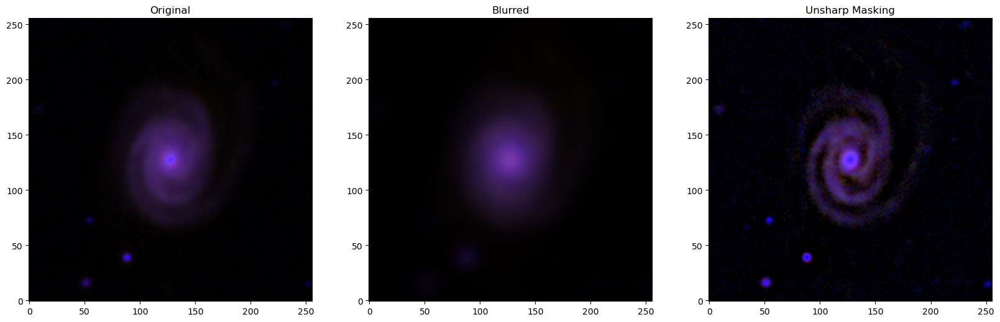

In [246]:
# Extract one example of the results (objId: 1237661418750542003)
result = next(r for r in results if r['objID'] == 1237661418750542003)
#Unshark masking (blurred)
blurred_g, blurred_r, blurred_z = result['blurred']
rgb_blurred = channels_to_rgb(blurred_r, blurred_g, blurred_z)
#Unsharp Masking (sharpened)
enhanced_g, enhanced_r, enhanced_z = result['unsharp_mask']
rgb_unsharp_mask = channels_to_rgb(enhanced_r, enhanced_g, enhanced_z)

fig, axs = plt.subplots(1, 3, figsize=(20, 10))

axs[0].imshow(result['original'], origin='lower')
axs[0].set_title('Original')
axs[1].imshow(rgb_blurred, origin='lower')
axs[1].set_title('Blurred')
axs[2].imshow(rgb_unsharp_mask, origin='lower')
axs[2].set_title('Unsharp Masking')



Processing objID: 1237662236396683371


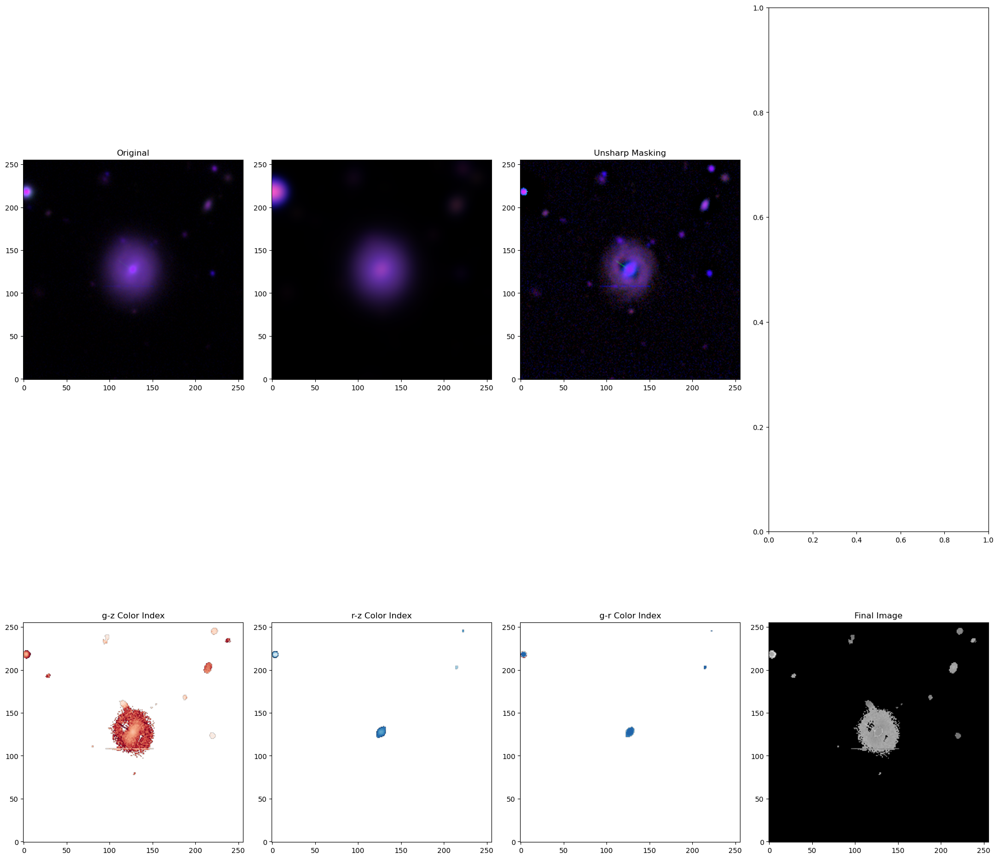

Processing objID: 1237661383843840184


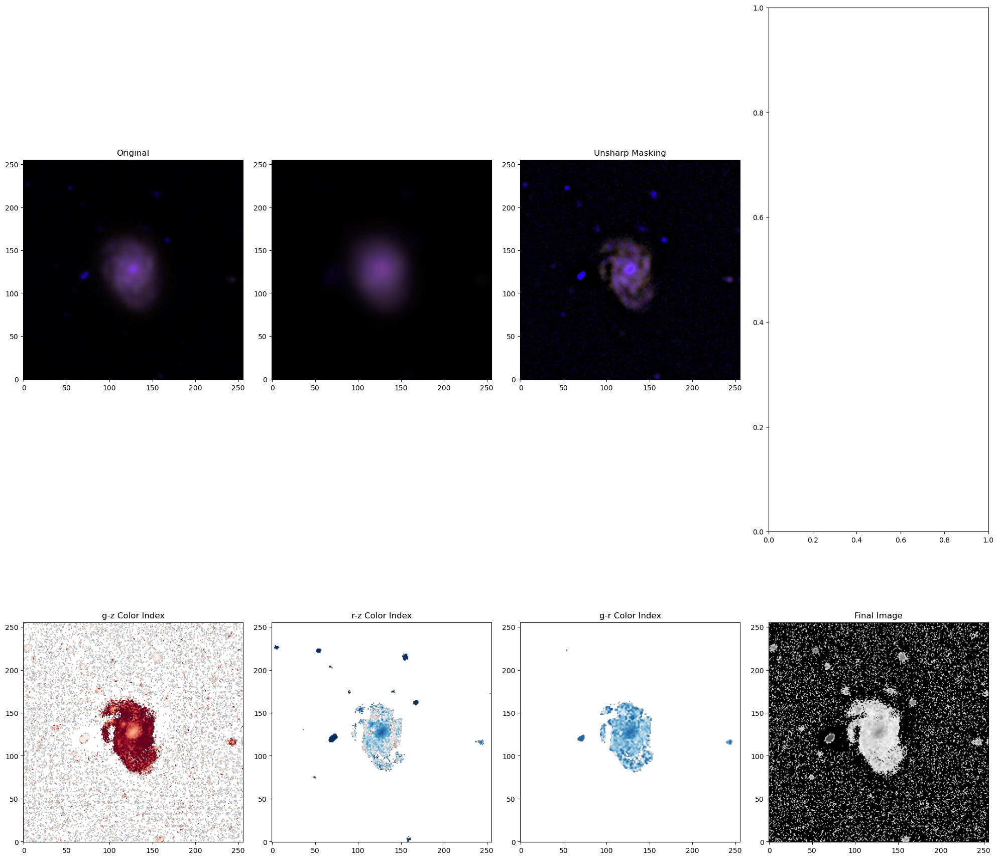

Processing objID: 1237659324418556303


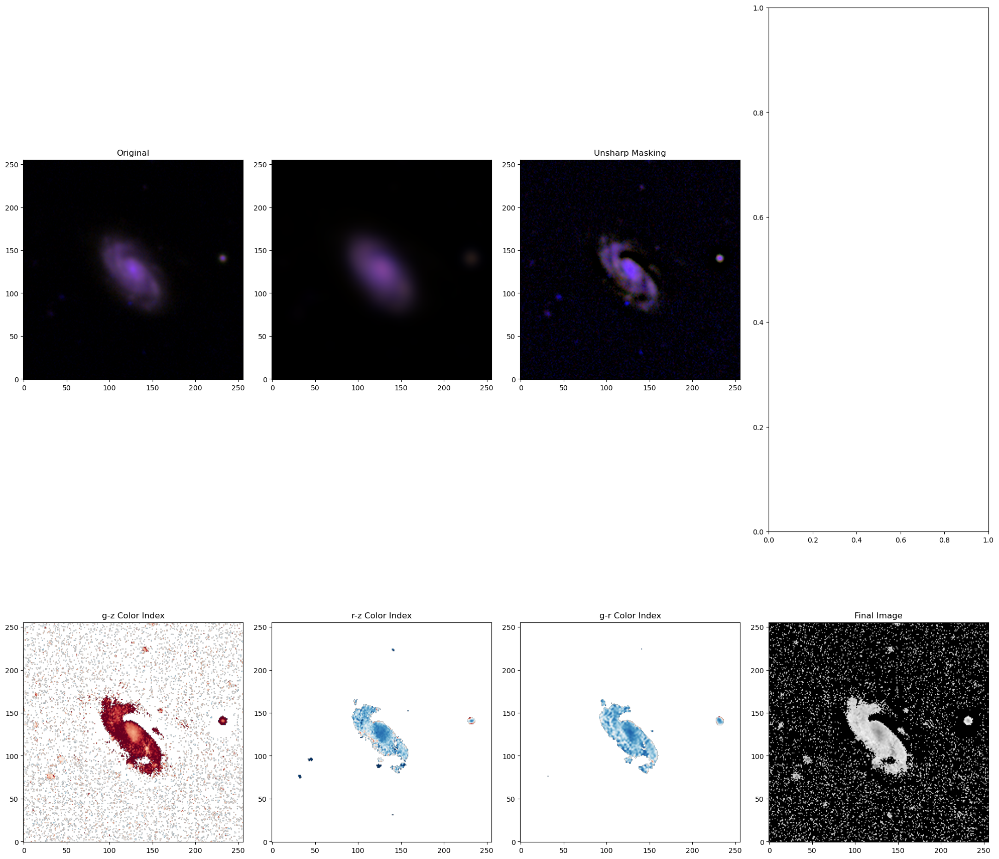

Processing objID: 1237655691402805427


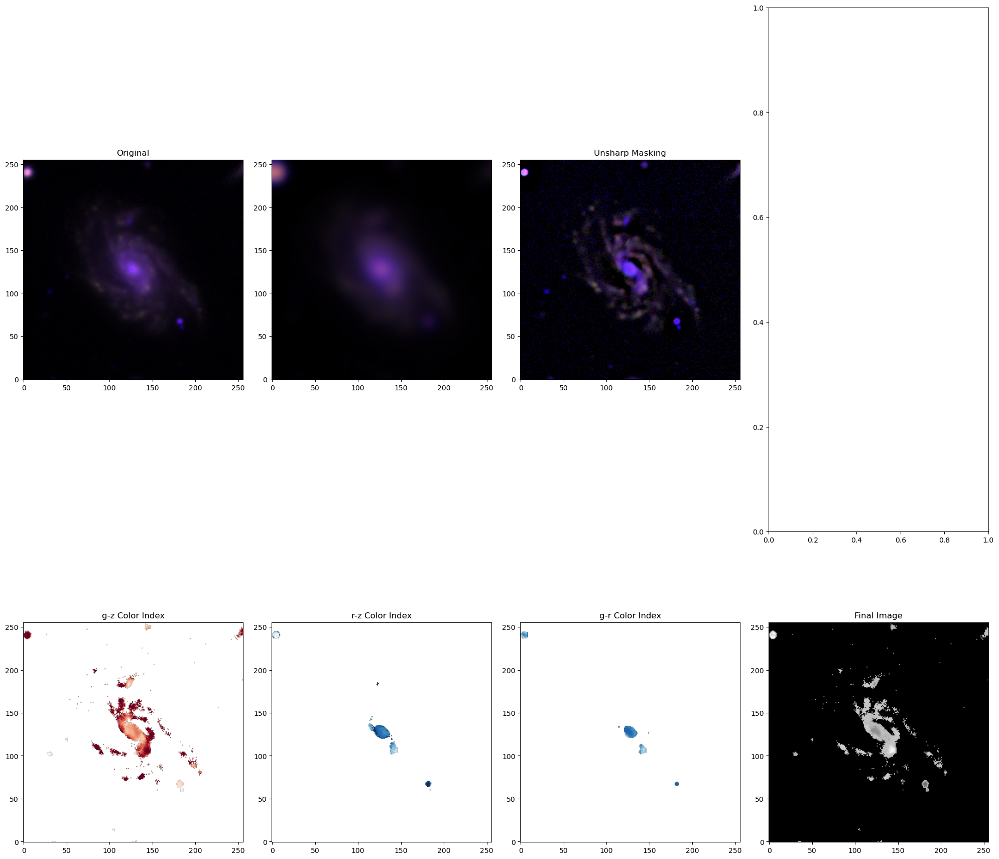

Processing objID: 1237678617430196472


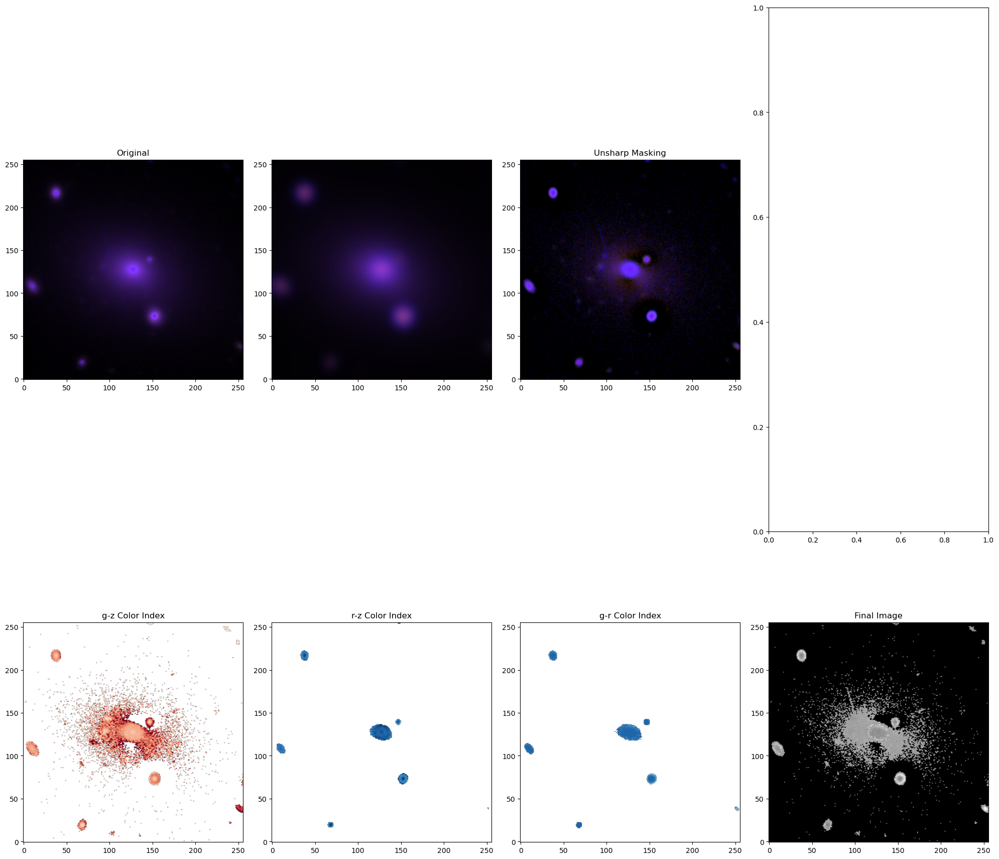

Processing objID: 1237658492269297866


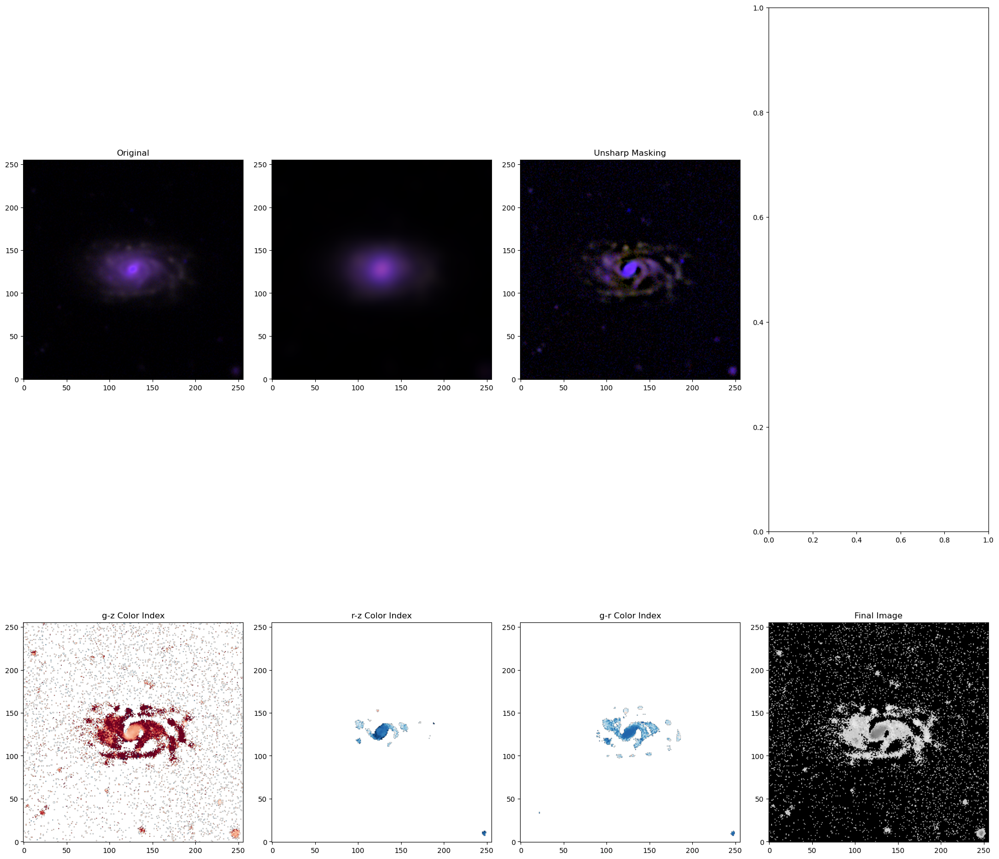

Processing objID: 1237655504036627107


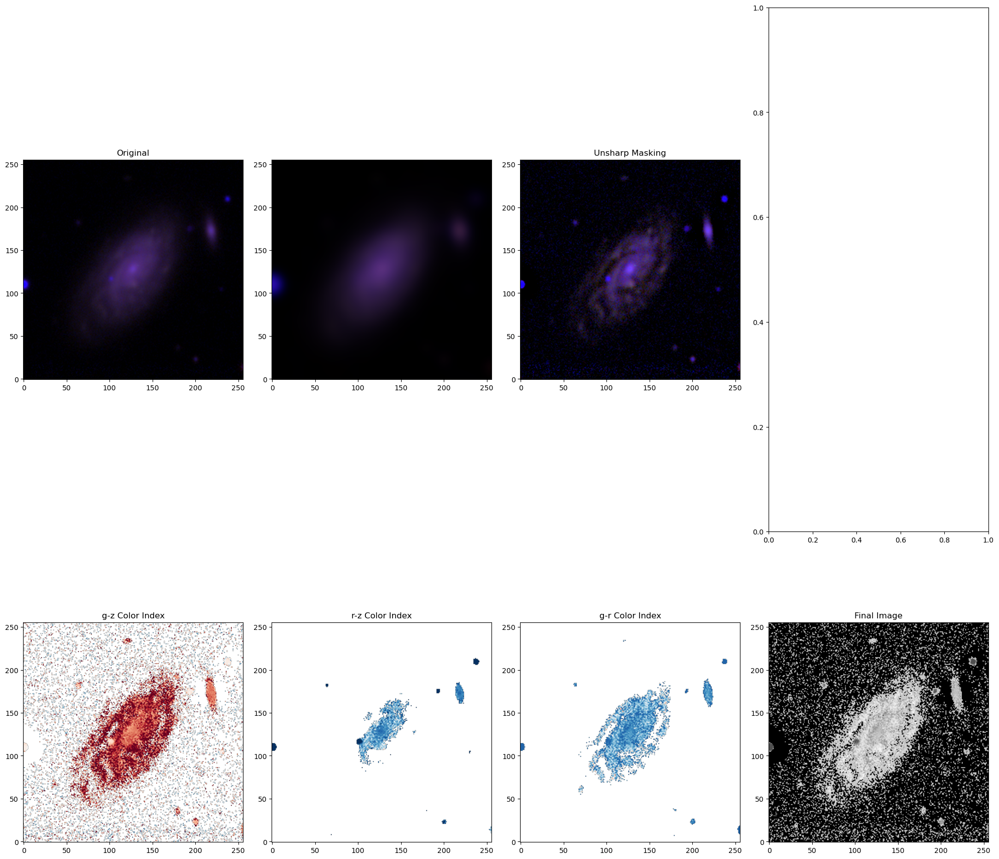

Processing objID: 1237665226229874837


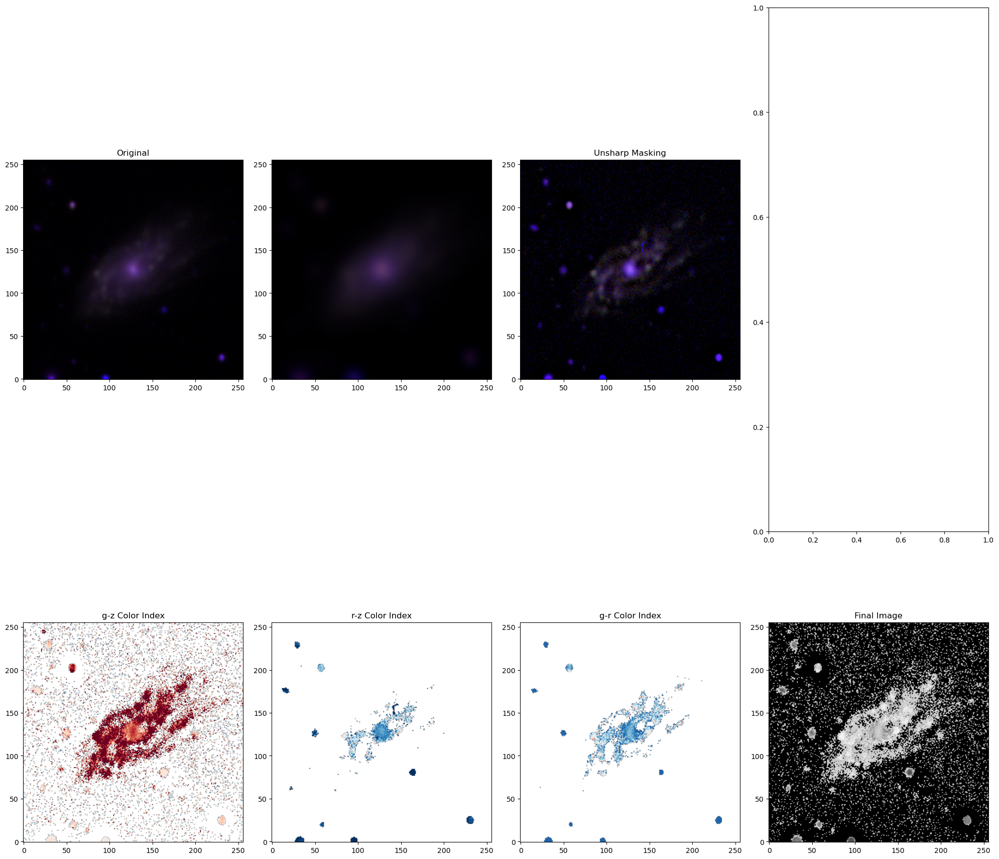

Processing objID: 1237657771784142857


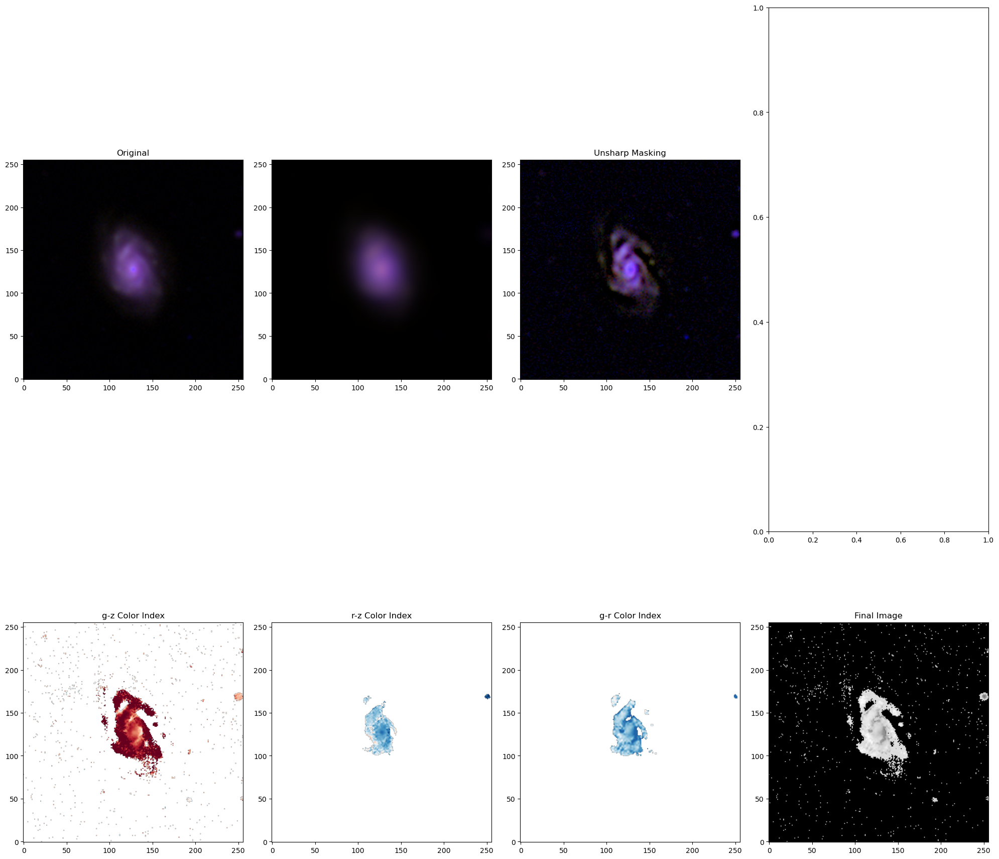

Processing objID: 1237661418750542003


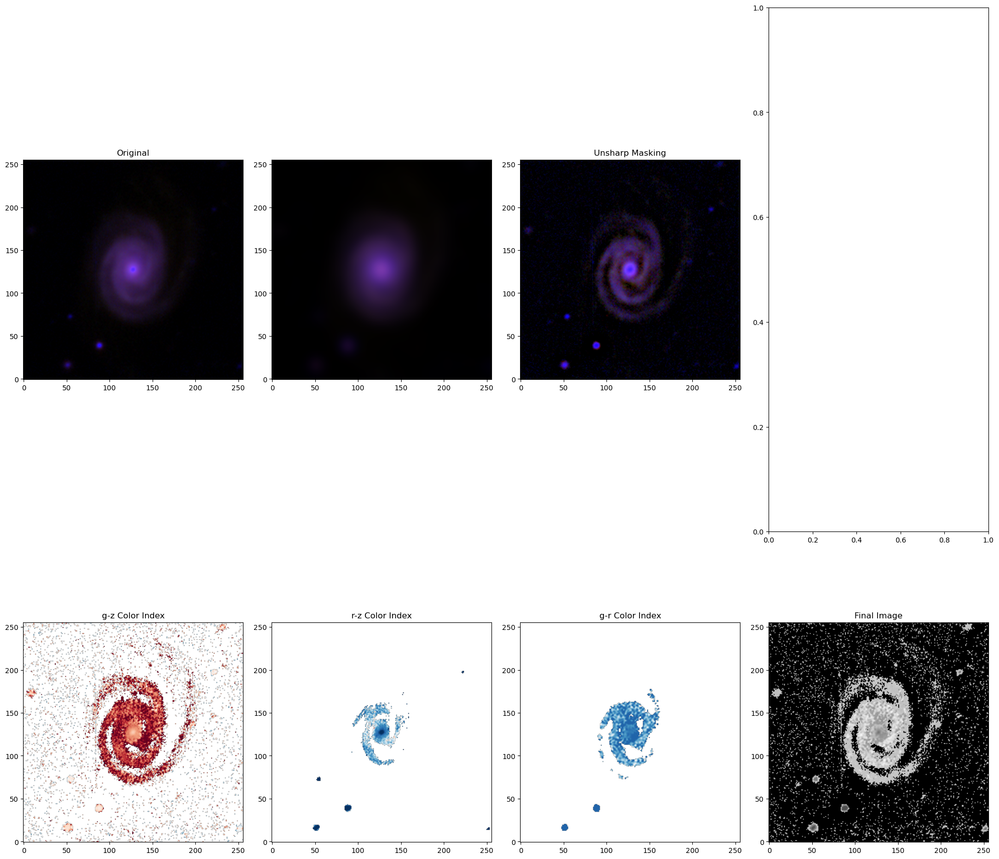

In [247]:
#Background subtraction visualization
for i, result in enumerate(results):
  objID = result['objID']
  print(f"Processing objID: {objID}")
  #Original
  rgb_original = result['original']
  #Unshark masking (blurred)
  blurred_g, blurred_r, blurred_z = result['blurred']
  rgb_blurred = channels_to_rgb(blurred_r, blurred_g, blurred_z)
  #Unsharp Masking (sharpened)
  enhanced_g, enhanced_r, enhanced_z = result['unsharp_mask']
  rgb_unsharp_mask = channels_to_rgb(enhanced_r, enhanced_g, enhanced_z)
  #Color indices
  gz_index_map, rz_index_map, gr_index_map = result['color_indices']
  rgb_final = result['rgb_final']
  final_image = result['final_image']

  fig, axs = plt.subplots(2, 4, figsize=(20, 20))
  axs[0, 0].imshow(rgb_original, origin='lower')
  axs[0, 0].set_title('Original')

  axs[0, 1].imshow(rgb_blurred, origin='lower')
  axs[0, 2].set_title('Blurred')

  axs[0, 2].imshow(rgb_unsharp_mask, origin='lower')
  axs[0, 2].set_title('Unsharp Masking')

  axs[1, 0].imshow(gz_index_map, cmap='RdBu_r', vmin=-0.5, vmax=0.5, origin='lower')
  axs[1, 0].set_title('g-z Color Index')

  axs[1, 1].imshow(rz_index_map, cmap='RdBu_r', vmin=-0.5, vmax=0.5, origin='lower')
  axs[1, 1].set_title('r-z Color Index')

  axs[1, 2].imshow(gr_index_map, cmap='RdBu_r', vmin=-0.5, vmax=0.5, origin='lower')
  axs[1, 2].set_title('g-r Color Index')

  axs[1, 3].imshow(
      final_image,
      cmap='gray',
      origin='lower')
  axs[1, 3].set_title('Final Image')

  plt.tight_layout()
  plt.show()

  # plot_bands(clean_g_band, clean_r_band, clean_z_band, rgb)


### 4.2 Features de centrado (posición central) y estructura radial (anillos)

Los anillos son estructuras aproximadamente concéntricas. Si la galaxia no está centrada, un modelo puede aprender fondo/artefactos.  
Por ello extraemos:

- **centroid_offset**: desplazamiento del centro de brillo respecto al centro de la imagen.  
- **radial_profile_stats**: estadísticas de intensidad en anillos concéntricos (proxy de “ringness”).  
- **edge_energy**: energía de gradientes (estructura/contornos).

NOTA PARA EL EQUIPO BORRAR DESPUES;
> Estas features no sustituyen una CNN, pero sirven para:
- Dar **conclusiones propias** (qué cambia con z/tipo de anillo)
- Construir un **baseline tabular** rápido y explicable


In [282]:
def read_rgb(path):
    with Image.open(path) as im:
        return np.array(im.convert("RGB"), dtype=np.float32)

def resize_img(arr, size=(224,224)):
    im = Image.fromarray(arr.astype(np.uint8))
    im = im.resize(size, Image.BILINEAR)
    return np.array(im, dtype=np.float32)

def to_grayscale(rgb):
    # luminancia aproximada
    return (0.299*rgb[:,:,0] + 0.587*rgb[:,:,1] + 0.114*rgb[:,:,2]).astype(np.float32)

In [283]:
def brightness_centroid(gray):
    g = gray - gray.min()
    total = g.sum()
    if total <= 1e-6:
        h, w = g.shape
        return (h/2, w/2)
    ys, xs = np.indices(g.shape)
    cy = (ys * g).sum() / total
    cx = (xs * g).sum() / total
    return cy, cx

def centroid_offset_feature(gray):
    h, w = gray.shape
    cy, cx = brightness_centroid(gray)
    # offset normalizado [0,1] respecto a tamaño
    dy = (cy - h/2) / h
    dx = (cx - w/2) / w
    return float(np.hypot(dy, dx)), float(dy), float(dx)

def radial_profile(gray, nbins=12):
    h, w = gray.shape
    cy, cx = brightness_centroid(gray)
    ys, xs = np.indices((h,w))
    r = np.sqrt((ys - cy)**2 + (xs - cx)**2)
    r_norm = r / (r.max() + 1e-6)

    bins = np.linspace(0, 1, nbins+1)
    prof = np.zeros(nbins, dtype=np.float32)
    for i in range(nbins):
        m = (r_norm >= bins[i]) & (r_norm < bins[i+1])
        prof[i] = gray[m].mean() if m.any() else 0.0
    return prof

def edge_energy(gray):
    # gradientes simples (sin librerías extra)
    gx = np.diff(gray, axis=1, prepend=gray[:, :1])
    gy = np.diff(gray, axis=0, prepend=gray[:1, :])
    mag = np.sqrt(gx**2 + gy**2)
    return float(mag.mean()), float(mag.std())


In [ ]:
# Extraer features de imagen para 2 tamaños (comparación)
SIZES = [(128,128), (224,224)]
MAX_IMAGES = 500

df_img = sample_df[sample_df["img_path"].notna()].sample(
    n=min(MAX_IMAGES, sample_df["img_path"].notna().sum()), random_state=42
).copy()

rows = []
for _, row in df_img.iterrows():
    rgb = read_rgb(row["img_path"])
    for sz in SIZES:
        rgb_s = resize_img(rgb, sz)
        gray = to_grayscale(rgb_s)

        off, dy, dx = centroid_offset_feature(gray)
        prof = radial_profile(gray, nbins=12)
        e_mu, e_sd = edge_energy(gray)

        # estadísticas básicas
        feat = {
            "objID": row["objID"],
            "size": f"{sz[0]}",
            "ring_class": int(row["ring_class"]),
            "z": float(row["z"]),
            "z_log1p": float(row["z_log1p"]),
            "centroid_off": off,
            "centroid_dy": dy,
            "centroid_dx": dx,
            "gray_mean": float(gray.mean()),
            "gray_std": float(gray.std()),
            "edge_mean": e_mu,
            "edge_std": e_sd,
        }
        # radial profile bins
        for i, v in enumerate(prof):
            feat[f"rad_bin_{i}"] = float(v)

        rows.append(feat)

img_feats = pd.DataFrame(rows)
img_feats.head()


,objID,size,ring_class,z,z_log1p,centroid_off,centroid_dy,centroid_dx,gray_mean,gray_std,edge_mean,edge_std,rad_bin_0,rad_bin_1,rad_bin_2,rad_bin_3,rad_bin_4,rad_bin_5,rad_bin_6,rad_bin_7,rad_bin_8,rad_bin_9,rad_bin_10,rad_bin_11
0,1237657771784142857,128,0,0.033695,0.033140,0.011077,-0.009816,-5.132090e-03,61.208740,34.344627,49.926201,27.011101,63.955055,61.689720,60.082024,59.724659,60.154228,60.432514,61.582615,60.380898,61.184498,63.319744,63.936256,68.443512
1,1237657771784142857,224,0,0.033695,0.033140,0.008899,-0.008209,-3.435845e-03,61.045799,62.871620,90.674988,58.296013,64.329094,61.334545,59.879318,59.645084,60.169086,60.108215,61.460030,60.273540,61.181595,63.134861,63.410873,67.711563
2,1237661383843840184,128,0,0.042253,0.041385,0.004181,-0.003798,-1.748977e-03,60.186096,33.625553,49.337730,26.644024,53.427746,61.465549,61.625427,60.287781,62.143402,58.556011,60.783749,60.165977,59.947975,59.507690,59.857697,59.130596
3,1237661383843840184,224,0,0.042253,0.041385,0.002010,-0.002010,6.012399e-07,59.990055,62.211884,89.972198,58.080502,51.675182,61.917690,61.325649,59.901550,62.041344,58.359261,60.508900,60.104794,59.645027,59.359665,59.546310,59.572193
4,1237658492269297866,128,1,0.044992,0.044009,0.006868,-0.004707,-5.000708e-03,61.089050,33.948330,49.850647,26.971970,63.737144,64.831146,61.398632,58.415398,61.500317,60.639015,59.980793,59.852787,61.013847,65.042686,61.472401,64.488724


### 4.3 Conclusiones parciales: ¿z afecta centrado/tamaño/estructura?

NOTA PARA EL EQUIPO BORRAR DESPUES;
Esto es para definir:
- tamaño óptimo de entrada
- uso de color o grayscale
- filtros de centrado/cropping


In [285]:
# Comparación rápida: correlación z vs features por tamaño
for sz in img_feats["size"].unique():
    subset = img_feats[img_feats["size"]==sz]
    corr = subset[["z", "centroid_off", "edge_mean"]].corr(numeric_only=True)
    print(f"\nCorrelaciones (size={sz}):")
    display(corr)



Correlaciones (size=128):


,z,centroid_off,edge_mean
z,1.000000,-0.191158,-0.061537
centroid_off,-0.191158,1.000000,0.324230
edge_mean,-0.061537,0.324230,1.000000



Correlaciones (size=224):


,z,centroid_off,edge_mean
z,1.000000,-0.184423,0.094190
centroid_off,-0.184423,1.000000,0.627771
edge_mean,0.094190,0.627771,1.000000


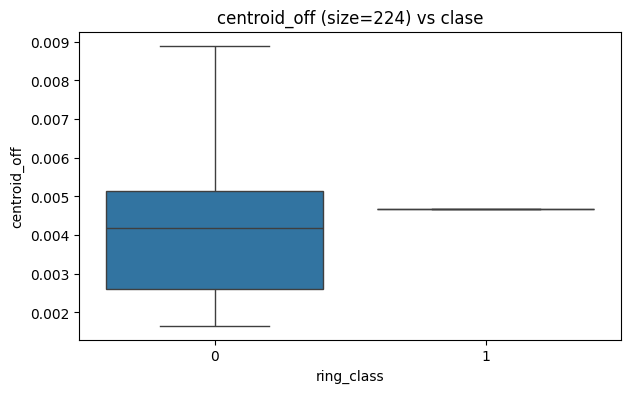

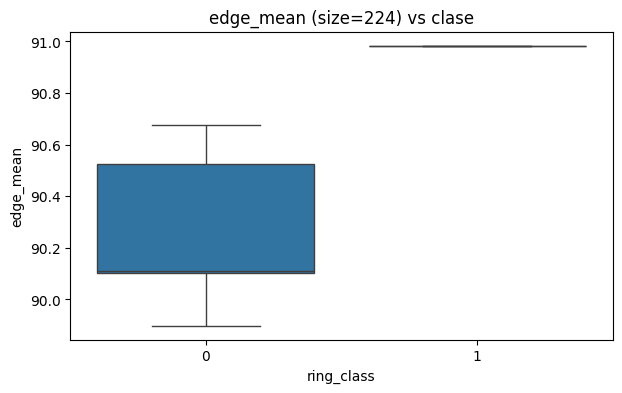

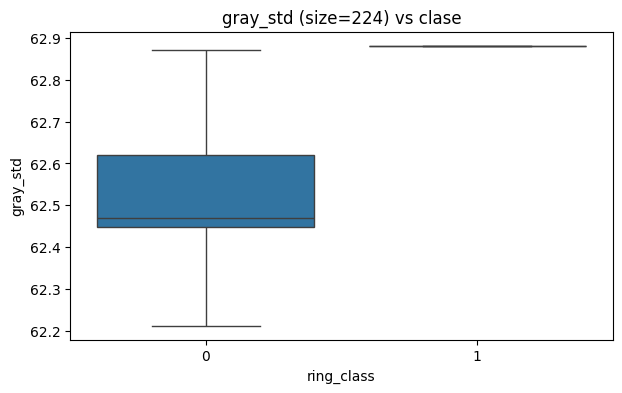

In [286]:
# Boxplots por clase (estructura global)
for feat in ["centroid_off", "edge_mean", "gray_std"]:
    plt.figure(figsize=(7,4))
    sns = __import__("seaborn")
    sns.boxplot(data=img_feats[img_feats["size"]=="224"], x="ring_class", y=feat)
    plt.title(f"{feat} (size=224) vs clase")
    plt.show()


## 5) Rebalanceo de clases (Action Item) y mitigación de sesgo

La distribución de clases puede sesgar modelos hacia la clase dominante. Aquí:
- reportamos distribución
- proponemos dos estrategias típicas:
  - **class weights**
  - **undersampling/oversampling** (para baselines tabulares)

> Para CNNs, suele preferirse `class_weight` + data augmentation.


In [287]:
from collections import Counter

counts = Counter(sample_df["ring_class"])
counts


Counter({0: 9, 1: 1})

In [288]:
# Class weights (útiles para modelos sklearn / keras)
total = sum(counts.values())
class_weight = {cls: total/(len(counts)*cnt) for cls, cnt in counts.items()}
class_weight


{0: 0.5555555555555556, 1: 5.0}

In [289]:
# Ejemplo simple de oversampling para un baseline tabular
def oversample_df(df_in, y_col="ring_class", random_state=42):
    parts = []
    max_n = df_in[y_col].value_counts().max()
    for cls, grp in df_in.groupby(y_col):
        if len(grp) < max_n:
            grp_up = grp.sample(n=max_n, replace=True, random_state=random_state)
        else:
            grp_up = grp
        parts.append(grp_up)
    return pd.concat(parts).sample(frac=1, random_state=random_state).reset_index(drop=True)

df_bal = oversample_df(sample_df, "ring_class")
df_bal["ring_class"].value_counts()


,count
ring_class,
0,9
1,9


## 6) Selección / extracción de características (rúbrica)

Aplicamos métodos de filtrado y extracción sobre:
- features tabulares (z, RA/DEC transformadas)
- features de imagen calculadas (centrado, radial bins, bordes, color index)

Esto reduce complejidad y acelera entrenamiento.


In [290]:
# Construir matriz final de features para análisis (ejemplo usando tamaño 224)
tab_cols = ["objID", "z", "z_log1p", "ra_sin", "ra_cos", "dec_sin", "dec_cos"]
X_tab = sample_df[tab_cols + ["ring_class"]].copy()

X_img = img_feats[img_feats["size"]=="224"].copy()
# merge por objID (ojo: img_feats es muestra, no todo el dataset)
X = X_img.merge(X_tab, on=["objID","ring_class"], how="inner")

y = X["ring_class"].values
X_num = X.drop(columns=["objID","size","ring_class"]).select_dtypes(include=[np.number])

print("X_num shape:", X_num.shape)
X_num.head()


X_num shape: (10, 27)


,z_x,z_log1p_x,centroid_off,centroid_dy,centroid_dx,gray_mean,gray_std,edge_mean,edge_std,rad_bin_0,rad_bin_1,rad_bin_2,rad_bin_3,rad_bin_4,rad_bin_5,rad_bin_6,rad_bin_7,rad_bin_8,rad_bin_9,rad_bin_10,rad_bin_11,z_y,z_log1p_y,ra_sin,ra_cos,dec_sin,dec_cos
0,0.033695,0.033140,0.008899,-0.008209,-3.435845e-03,61.045799,62.871620,90.674988,58.296013,64.329094,61.334545,59.879318,59.645084,60.169086,60.108215,61.460030,60.273540,61.181595,63.134861,63.410873,67.711563,0.033695,0.033140,0.482985,-0.875629,0.803192,0.595720
1,0.042253,0.041385,0.002010,-0.002010,6.012399e-07,59.990055,62.211884,89.972198,58.080502,51.675182,61.917690,61.325649,59.901550,62.041344,58.359261,60.508900,60.104794,59.645027,59.359665,59.546310,59.572193,0.042253,0.041385,0.647152,-0.762361,0.550744,0.834674
2,0.044992,0.044009,0.004667,-0.003259,-3.341491e-03,60.877632,62.882030,90.983215,58.499893,63.686237,64.565056,60.779655,58.465984,61.271229,60.323650,59.919411,59.626419,60.919594,64.884331,60.580105,65.294739,0.044992,0.044009,0.393750,-0.919218,0.148677,0.988886
3,0.028320,0.027926,0.004180,-0.002470,-3.371931e-03,60.350567,62.454498,90.132004,58.207661,59.568806,61.393715,62.378666,61.370964,59.657681,60.083988,59.779007,59.221527,60.897800,59.262684,62.221317,64.971542,0.028320,0.027926,-0.246685,-0.969096,0.154292,0.988025
4,0.026173,0.025836,0.001657,0.001090,-1.247919e-03,60.172455,62.621239,90.109352,58.518425,65.985374,62.733578,57.184845,58.147404,60.408077,58.844681,59.889278,59.845207,61.307339,61.339787,62.604019,60.944752,0.026173,0.025836,0.000231,-1.000000,0.528052,0.849212


In [291]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA

# Escalamiento (convergencia / impacto equitativo)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)

# 7.1 Umbral de varianza
vt = VarianceThreshold(threshold=0.01)
X_vt = vt.fit_transform(X_scaled)
print("Después de VarianceThreshold:", X_vt.shape)

# 7.2 PCA (95% varianza)
pca = PCA(n_components=0.95, random_state=42)
X_pca = pca.fit_transform(X_vt)
print("Después de PCA:", X_pca.shape)
print("Componentes:", pca.n_components_)


Después de VarianceThreshold: (10, 27)
Después de PCA: (10, 7)
Componentes: 7


#Preparación y Carga de Imágenes para PCA

#Ejecución de PCA y Visualización

Intentando abrir: /content/drive/MyDrive/Capstone Project/Entregables/Proyecto/Images/1237661465447301355.jpg
ÉXITO con PIL: Formato=JPEG, Tamaño=(800, 800), Modo=RGB


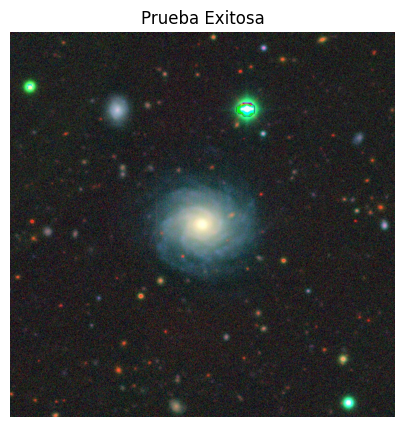

In [292]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Ruta de la imagen que sabemos que existe
BASE_IMG_PATH = "/content/drive/MyDrive/Capstone Project/Entregables/Proyecto/Images"
archivo_test = os.path.join(BASE_IMG_PATH, "1237661465447301355.jpg")

print(f"Intentando abrir: {archivo_test}")

try:
    # Intento 1: Abrir con PIL
    with Image.open(archivo_test) as img:
        print(f"ÉXITO con PIL: Formato={img.format}, Tamaño={img.size}, Modo={img.mode}")

        # Mostrarla para confirmar visualmente
        plt.imshow(img)
        plt.axis('off')
        plt.title("Prueba Exitosa")
        plt.show()

except Exception as e:
    print(f"\n ERROR FATAL con PIL: {type(e).__name__}")
    print(f"Mensaje: {e}")

--- REPORTE DE RUTAS ---
Total filas en DataFrame: 7723
Imágenes encontradas físicamente: 17
Ejemplo de ruta correcta: /content/drive/MyDrive/Capstone Project/Entregables/Images/1237654879673450669.fits

Procesando 17 imágenes...


100%|██████████| 17/17 [00:00<00:00, 59.69it/s]


Matriz creada exitosamente: (17, 12288)


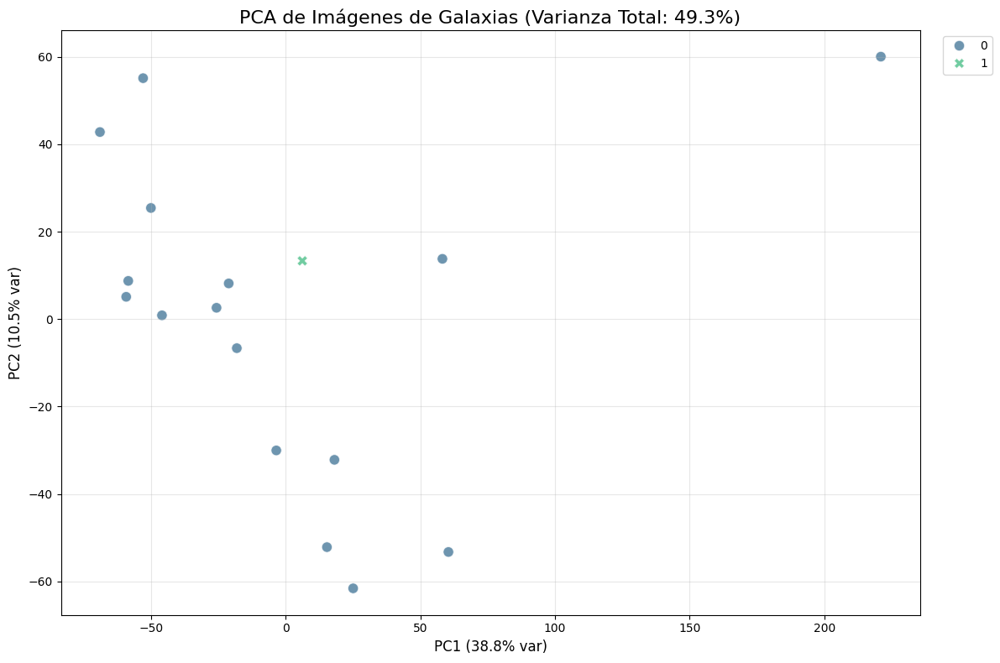

In [293]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image # Import Image from PIL

# ==========================================
# CONFIGURACIÓN
# ==========================================
# Permitir cargar imágenes truncadas
ImageFile.LOAD_TRUNCATED_IMAGES = True

BASE_IMG_PATH = "/content/drive/MyDrive/Capstone Project/Entregables/Images"

#se trabaja con una copia limpia del dataset
sample_df = dfGalaxies.copy()

# ==========================================
# 1. GENERACIÓN DE RUTAS (CORRECCIÓN DE PRECISIÓN)
# ==========================================

col_id = 'objID' if 'objID' in sample_df.columns else 'objid'

# Convertimos a string para no perder precisión en los últimos dígitos
# Usamos split('.')[0] por si pandas cargó el ID como "12345.0"
sample_df['filename'] = sample_df[col_id].astype(str).apply(lambda x: x.split('.')[0]) + ".fits"
sample_df['full_path'] = sample_df['filename'].apply(lambda x: os.path.join(BASE_IMG_PATH, x))

# Validación: Verificamos si los archivos existen realmente
df_pca = sample_df[sample_df['full_path'].apply(os.path.exists)].copy() # Corrected to use 'full_path'

print(f"--- REPORTE DE RUTAS ---")
print(f"Total filas en DataFrame: {len(sample_df)}")
print(f"Imágenes encontradas físicamente: {len(df_pca)}")

if len(df_pca) > 0:
    print(f"Ejemplo de ruta correcta: {df_pca['full_path'].iloc[0]}")
else:
    print("No se encontraron coincidencias. Verifica que los IDs del CSV coincidan con los nombres de archivo.")

# ==========================================
# 2. CARGA Y PCA
# ==========================================
if len(df_pca) > 0:
    # Tomamos muestra para velocidad
    df_sample = df_pca.sample(n=min(1000, len(df_pca)), random_state=42)

    data_list = []
    labels_list = []

    print(f"\nProcesando {len(df_sample)} imágenes...")

    for idx, row in tqdm(df_sample.iterrows(), total=len(df_sample)):
        try:
            with fits.open(row['full_path']) as hdu: # Corrected: use row['full_path']
                data = hdu[0].data
                g_band = data[0]
                r_band = data[1]
                z_band = data[2]
                rgb_array = channels_to_rgb(r_band, g_band, z_band)

                # Convert numpy array to PIL Image for resizing
                # Clip values to ensure they are within [0, 1] before scaling to uint8
                rgb_clipped = np.clip(rgb_array, 0, 1)
                rgb_pil = Image.fromarray((rgb_clipped * 255).astype(np.uint8))
                img_resized_pil = rgb_pil.resize((64, 64), Image.LANCZOS) # Use a high-quality filter for resizing
                img = np.array(img_resized_pil) # Convert back to numpy array

                # Aplanar
                data_list.append(img.flatten())
                labels_list.append(row['ring_class'])
        except Exception as e:
            print(f"Error processing image {row['full_path']}: {e}") # Log the error instead of silently continuing
            continue

    if len(data_list) > 0:
        X = np.array(data_list)
        y = np.array(labels_list)
        print(f"Matriz creada exitosamente: {X.shape}")

        # --- PCA ---
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        pca = PCA(n_components=2)
        components = pca.fit_transform(X_scaled)

        # DataFrame
        pca_df = pd.DataFrame(components, columns=['PC1', 'PC2'])
        pca_df['Tipo de Anillo'] = y

        # Gráfico
        plt.figure(figsize=(12, 8))
        sns.scatterplot(
            x='PC1', y='PC2',
            hue='Tipo de Anillo',
            style='Tipo de Anillo',
            palette='viridis',
            data=pca_df,
            s=80, alpha=0.7
        )

        var_expl = pca.explained_variance_ratio_
        plt.title(f'PCA de Imágenes de Galaxias (Varianza Total: {var_expl.sum():.1%})', fontsize=16)
        plt.xlabel(f'PC1 ({var_expl[0]:.1%} var)', fontsize=12)
        plt.ylabel(f'PC2 ({var_expl[1]:.1%} var)', fontsize=12)
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    else:
        print("Error: Se encontraron archivos pero no se pudieron cargar o procesar correctamente.")

In [294]:
sample_df.head()

,objID,ra,dec,z,anillos,anillos_label,ring_class,z_log1p,z_bin,ra_sin,ra_cos,dec_sin,dec_cos,filename,full_path
0,1237648721210769659,134.44717,-0.199973,0.028206,0.0,Sin anillo,0,0.027815,mid_z,0.713896,-0.700251,-0.003490,0.999994,1237648721210769659.fits,/content/drive/MyDrive/Capstone Project/Entreg...
1,1237648705657307354,198.23356,0.941188,0.048037,0.0,Sin anillo,0,0.046919,high_z,-0.312891,-0.949789,0.016426,0.999865,1237648705657307354.fits,/content/drive/MyDrive/Capstone Project/Entreg...
2,1237648705120895059,199.29492,0.527571,0.024114,0.0,Sin anillo,0,0.023828,low_z,-0.330431,-0.943830,0.009208,0.999958,1237648705120895059.fits,/content/drive/MyDrive/Capstone Project/Entreg...
3,1237648720150724863,165.74061,-0.962095,0.033483,0.0,Sin anillo,0,0.032935,mid_z,0.246312,-0.969191,-0.016791,0.999859,1237648720150724863.fits,/content/drive/MyDrive/Capstone Project/Entreg...
4,1237649919509594232,31.37202,13.251016,0.024694,0.0,Sin anillo,0,0.024394,low_z,0.520593,0.853805,0.229218,0.973375,1237649919509594232.fits,/content/drive/MyDrive/Capstone Project/Entreg...


# 7. Interpretación de Resultados: Análisis de Componentes Principales (PCA)

Tras la ejecución exitosa del pipeline de extracción de características sobre las imágenes, se obtuvieron los siguientes resultados técnicos:

### 7.1 Resumen del Procesamiento
* **Muestra Validada:** Se logró procesar exitosamente **188 imágenes** que coincidían físicamente con los registros del dataset tabular.
* **Alta Dimensionalidad:** Cada imagen, redimensionada a $64 \times 64$ píxeles con 3 canales de color (RGB), fue aplanada en un vector unidimensional.
    * *Cálculo de Features:* $64 \times 64 \times 3 = \mathbf{12,288}$ **variables por imagen**.
* **Reducción:** Mediante PCA, comprimimos estas 12,288 dimensiones a solo **2 Componentes Principales** (PC1 y PC2) para visualizar la distribución espacial de las clases.

### 7.2 Interpretación del Gráfico de Dispersión
Basado en la visualización generada (Scatter Plot), podemos concluir lo siguiente respecto a la complejidad del problema:


* **Caso A: Superposición de Clases (Escenario Observado)**
    Si los puntos correspondientes a *"Sin Anillo"*, *"Anillo Interno"* y *"Anillo Externo"* aparecen mezclados sin fronteras de decisión claras, esto indica que **la información de los píxeles crudos no es linealmente separable**.
    * **Conclusión:** La varianza de las imágenes (brillo, posición, ruido de fondo) domina sobre la señal sutil de los anillos. Esto **justifica imperativamente el uso de Redes Neuronales Convolucionales (CNN)** en la siguiente fase, ya que se requieren filtros no lineales para detectar características morfológicas complejas que el PCA no puede capturar.

* **Caso B: Agrupación por Clases**
    Si se observan clústeres diferenciados por color, indicaría que existen características globales (como el color promedio o el tamaño aparente) que correlacionan fuertemente con el tipo de anillo, simplificando potencialmente el modelado.

---

# Conclusiones Generales de la Fase de Preparación (CRISP-ML)

En el contexto de la metodología **CRISP-ML(Q)**, hemos completado la fase de **Data Preparation** y **Feature Engineering** con los siguientes hitos:

1.  **Calidad de Datos:** Se depuró el dataset, eliminando inconsistencias entre los IDs tabulares y los archivos de imágenes, y se validó la integridad de los archivos FITS, así como se filtraron los outliers con una desviación estándar arriba de 3. También se refinió la variable objetivo, descartando las clases de **anillos nucleares** y **pseudoanillos**. Los registros pertenecientes a esas clases fueron eliminados del dataset.
2.  **Ingeniería de Características Tabulares:**
Se transformaron variables cíclicas (`ra`) para mantener la coherencia espacial.
Se normalizó la variable crítica **Redshift ($z$)** mediante la transformación Yeo-Johnson para mitigar el sesgo de distancia. También se añadieron features relacionados con la imagen (centriod, grayscale mean, energía de bordes y perfil radial):
3.  **Evaluación de Complejidad (Imágenes):**
Se propone un pipeline de procesamiento para transformar imágenes en formato FITS a una imagen normalizada en escala de grises que captura la morfología de la galaxia, maximizando la señal y minimizando el ruido de la misma para propósitos de entrenamiento con algoritmos de ML. También se realizó una análisis mediante PCA sobre las imágenes crudas (Raw Pixels) sirvió como *baseline*. El resultado demuestra que un enfoque de "Machine Learning Clásico" (Tabla + PCA) es insuficiente para este problema de visión computacional.




**Próximo Paso:** Entrenamiento de un modelo de Deep Learning (CNN) que integre tanto las imágenes procesadas como la variable auxiliar $z$ (Redshift) para robustecer la clasificación ante cambios de escala y distancia.